# Pix2Pix Ablation Study

Testing different hyperparameters for manga colorization. Want to see which settings work best.

In [10]:
import os
import sys

os.chdir('/Users/zhaomingming/Desktop/MangaColorization')
sys.path.append('src')

print(f"working dir: {os.getcwd()}")

working dir: /Users/zhaomingming/Desktop/MangaColorization


In [11]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from dataset import MangaDataset
from model import UNetGenerator, PatchGANDiscriminator
import csv
import matplotlib.pyplot as plt

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f"using: {device}")

using: mps


In [12]:
def train_experiment(image_size=256, batch_size=16, lr=2e-4, l1_lambda=100, epochs=100, output_dir='experiments/test'):
    """
    main training loop. saves checkpoints every 25 epochs so i can compare different stages.
    also tracks train/val loss for plotting later.
    """
    print(f"\n{'='*50}")
    print(f"config: {image_size}px, bs={batch_size}, lr={lr}, L1={l1_lambda}, ep={epochs}")
    print(f"output: {output_dir}")
    print(f"{'='*50}\n")
    
    os.makedirs(output_dir, exist_ok=True)
    os.makedirs(f"{output_dir}/checkpoints", exist_ok=True)
    
    train_dataset = MangaDataset("data/train", image_size=image_size)
    val_dataset = MangaDataset("data/val", image_size=image_size)
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    
    print(f"train: {len(train_dataset)} images, val: {len(val_dataset)} images")
    
    G = UNetGenerator().to(device)
    D = PatchGANDiscriminator().to(device)
    
    # beta1=0.5 from the original pix2pix paper
    optimizer_G = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_D = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
    
    criterion_GAN = nn.MSELoss()
    criterion_L1 = nn.L1Loss()
    
    loss_history = {
        'epoch': [],
        'train_D_loss': [], 'train_G_loss': [],
        'val_D_loss': [], 'val_G_loss': []
    }
    
    for epoch in range(epochs):
        G.train()
        D.train()
        
        train_D_sum, train_G_sum, train_batches = 0, 0, 0
        
        for gray, real_color in train_loader:
            gray = gray.to(device)
            real_color = real_color.to(device)
            
            fake_color = G(gray)
            
            # discriminator update
            pred_real = D(gray, real_color)
            loss_D_real = criterion_GAN(pred_real, torch.ones_like(pred_real))
            
            pred_fake = D(gray, fake_color.detach())
            loss_D_fake = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))
            
            loss_D = (loss_D_real + loss_D_fake) / 2
            
            optimizer_D.zero_grad()
            loss_D.backward()
            optimizer_D.step()
            
            # generator update
            pred_fake = D(gray, fake_color)
            loss_G_GAN = criterion_GAN(pred_fake, torch.ones_like(pred_fake))
            loss_G_L1 = criterion_L1(fake_color, real_color) * l1_lambda
            loss_G = loss_G_GAN + loss_G_L1
            
            optimizer_G.zero_grad()
            loss_G.backward()
            optimizer_G.step()
            
            train_D_sum += loss_D.item()
            train_G_sum += loss_G.item()
            train_batches += 1
        
        # validation
        G.eval()
        D.eval()
        val_D_sum, val_G_sum, val_batches = 0, 0, 0
        
        with torch.no_grad():
            for gray, real_color in val_loader:
                gray = gray.to(device)
                real_color = real_color.to(device)
                
                fake_color = G(gray)
                
                pred_real = D(gray, real_color)
                pred_fake = D(gray, fake_color)
                
                loss_D = (criterion_GAN(pred_real, torch.ones_like(pred_real)) + 
                         criterion_GAN(pred_fake, torch.zeros_like(pred_fake))) / 2
                
                loss_G = (criterion_GAN(pred_fake, torch.ones_like(pred_fake)) + 
                         criterion_L1(fake_color, real_color) * l1_lambda)
                
                val_D_sum += loss_D.item()
                val_G_sum += loss_G.item()
                val_batches += 1
        
        # record avg losses
        avg_train_D = train_D_sum / train_batches
        avg_train_G = train_G_sum / train_batches
        avg_val_D = val_D_sum / val_batches
        avg_val_G = val_G_sum / val_batches
        
        loss_history['epoch'].append(epoch + 1)
        loss_history['train_D_loss'].append(avg_train_D)
        loss_history['train_G_loss'].append(avg_train_G)
        loss_history['val_D_loss'].append(avg_val_D)
        loss_history['val_G_loss'].append(avg_val_G)
        
        if (epoch + 1) % 10 == 0:
            print(f"ep {epoch+1}/{epochs} | D: {avg_train_D:.4f}/{avg_val_D:.4f} | G: {avg_train_G:.4f}/{avg_val_G:.4f}")
        
        # save checkpoint every 25 epochs
        if (epoch + 1) % 25 == 0:
            torch.save(G.state_dict(), f"{output_dir}/checkpoints/G_epoch_{epoch+1}.pth")
            torch.save(D.state_dict(), f"{output_dir}/checkpoints/D_epoch_{epoch+1}.pth")
            print(f"  -> checkpoint saved")
    
    # save final
    torch.save(G.state_dict(), f"{output_dir}/checkpoints/G_final.pth")
    torch.save(D.state_dict(), f"{output_dir}/checkpoints/D_final.pth")
    
    # save loss csv
    with open(f"{output_dir}/loss_history.csv", 'w', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(['epoch', 'train_D_loss', 'train_G_loss', 'val_D_loss', 'val_G_loss'])
        for i in range(len(loss_history['epoch'])):
            writer.writerow([loss_history['epoch'][i], loss_history['train_D_loss'][i],
                           loss_history['train_G_loss'][i], loss_history['val_D_loss'][i],
                           loss_history['val_G_loss'][i]])
    
    # plot
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    axes[0].plot(loss_history['epoch'], loss_history['train_D_loss'], label='train')
    axes[0].plot(loss_history['epoch'], loss_history['val_D_loss'], label='val')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('D Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    axes[1].plot(loss_history['epoch'], loss_history['train_G_loss'], label='train')
    axes[1].plot(loss_history['epoch'], loss_history['val_G_loss'], label='val')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].set_title('G Loss')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(f"{output_dir}/loss_curve.png", dpi=150)
    plt.show()
    
    print("done!")
    return loss_history

---
## Exp 1: Baseline

Default settings to establish a baseline. Will compare other experiments against this.


config: 256px, bs=16, lr=0.0002, L1=100, ep=100
output: experiments/baseline

train: 1024 images, val: 257 images
ep 10/100 | D: 0.1014/0.2275 | G: 10.8811/9.7695
ep 20/100 | D: 0.1340/0.2588 | G: 10.2552/9.8178
  -> checkpoint saved
ep 30/100 | D: 0.1639/0.2688 | G: 8.8429/10.6807
ep 40/100 | D: 0.1804/0.2505 | G: 7.1655/9.8367
ep 50/100 | D: 0.1927/0.2541 | G: 6.0719/9.5121
  -> checkpoint saved
ep 60/100 | D: 0.2106/0.2402 | G: 5.2834/9.2554
ep 70/100 | D: 0.2111/0.2451 | G: 4.6637/9.2809
  -> checkpoint saved
ep 80/100 | D: 0.2208/0.2532 | G: 4.2039/9.4777
ep 90/100 | D: 0.2300/0.2629 | G: 3.8198/9.0799
ep 100/100 | D: 0.2256/0.2515 | G: 3.5301/9.2038
  -> checkpoint saved


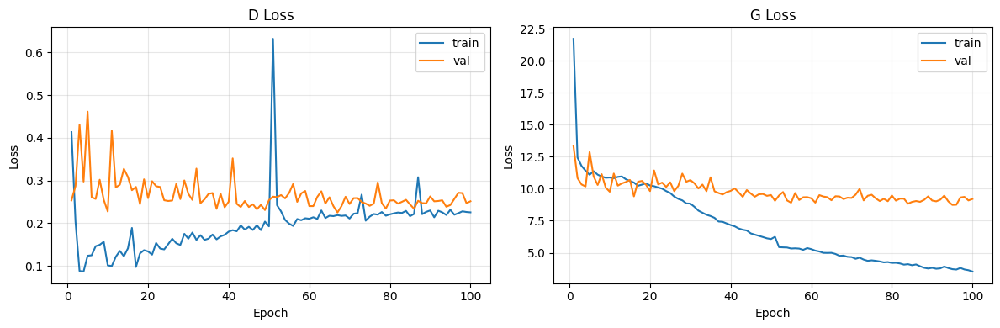

done!


In [13]:
loss_baseline = train_experiment(
    image_size=256,
    batch_size=16,
    lr=2e-4,
    l1_lambda=100,
    epochs=100,
    output_dir='experiments/baseline'
)

---
## Exp 2: Batch Size 32

Larger batch = more stable gradient estimates, but maybe worse generalization?


config: 256px, bs=32, lr=0.0002, L1=100, ep=100
output: experiments/batch_size_32

train: 1024 images, val: 257 images
ep 10/100 | D: 0.1068/0.3712 | G: 10.5767/11.1797
ep 20/100 | D: 0.0976/0.3081 | G: 10.4497/10.2603
  -> checkpoint saved
ep 30/100 | D: 0.2123/3.1927 | G: 9.1116/12.5602
ep 40/100 | D: 0.1811/0.2545 | G: 7.4064/9.5122
ep 50/100 | D: 0.2200/0.2569 | G: 5.8672/10.5242
  -> checkpoint saved
ep 60/100 | D: 0.2161/0.2568 | G: 5.5181/8.9295
ep 70/100 | D: 0.2041/0.2491 | G: 4.9870/9.0174
  -> checkpoint saved
ep 80/100 | D: 0.2435/0.2495 | G: 4.1534/8.5924
ep 90/100 | D: 0.2384/0.4443 | G: 4.1813/9.1807
ep 100/100 | D: 0.2306/0.2470 | G: 3.9602/9.1104
  -> checkpoint saved


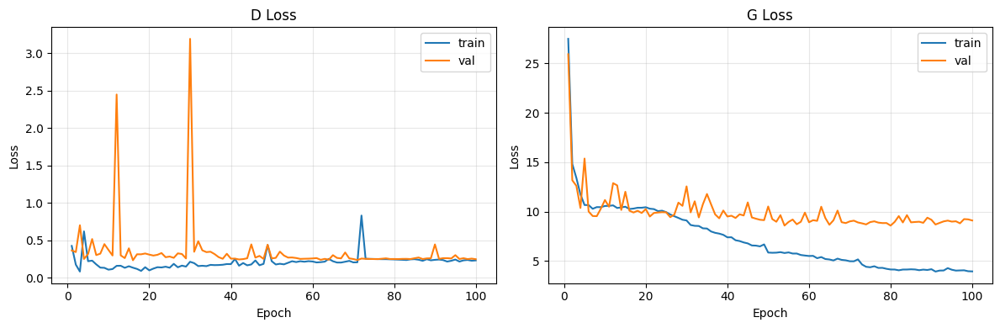

done!


In [14]:
loss_batch = train_experiment(
    image_size=256,
    batch_size=32,
    lr=2e-4,
    l1_lambda=100,
    epochs=100,
    output_dir='experiments/batch_size_32'
)

---
## Exp 3: Learning Rate 0.0004

Double the lr. Might converge faster, or might be unstable.


config: 256px, bs=16, lr=0.0004, L1=100, ep=100
output: experiments/lr_0004

train: 1024 images, val: 257 images
ep 10/100 | D: 0.1439/0.2714 | G: 10.3078/11.0574
ep 20/100 | D: 0.1209/0.2805 | G: 10.2157/9.8198
  -> checkpoint saved
ep 30/100 | D: 0.1335/0.2620 | G: 9.9980/9.8969
ep 40/100 | D: 0.1569/0.2992 | G: 9.0626/10.2357
ep 50/100 | D: 0.1659/0.3266 | G: 7.8516/10.2423
  -> checkpoint saved
ep 60/100 | D: 0.2348/0.2563 | G: 6.4405/9.5821
ep 70/100 | D: 0.2236/0.3035 | G: 5.9320/9.6888
  -> checkpoint saved
ep 80/100 | D: 0.2236/0.2686 | G: 5.2316/9.0879
ep 90/100 | D: 0.2348/0.2472 | G: 4.6124/8.9251
ep 100/100 | D: 0.2266/0.2435 | G: 4.1373/9.2661
  -> checkpoint saved


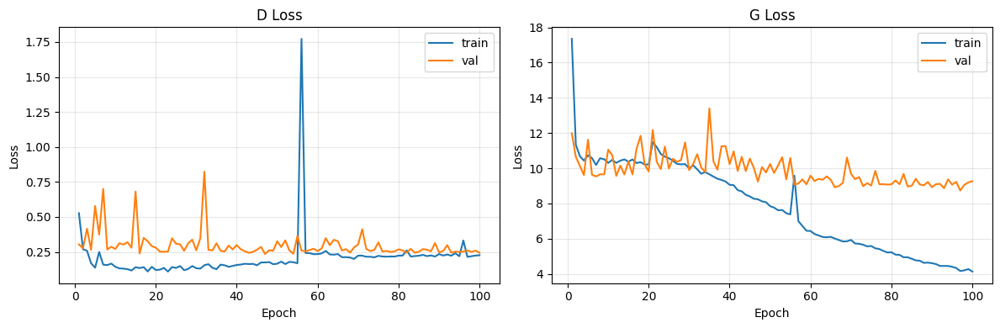

done!


In [15]:
loss_lr = train_experiment(
    image_size=256,
    batch_size=16,
    lr=4e-4,
    l1_lambda=100,
    epochs=100,
    output_dir='experiments/lr_0004'
)

---
## Exp 4: L1 Weight 200

Higher L1 weight means more emphasis on pixel accuracy. Should give more accurate colors but might be blurry.


config: 256px, bs=16, lr=0.0002, L1=200, ep=100
output: experiments/l1_200

train: 1024 images, val: 257 images
ep 10/100 | D: 0.0860/0.3447 | G: 19.9135/18.7118
ep 20/100 | D: 0.0220/0.3073 | G: 18.0446/18.1376
  -> checkpoint saved
ep 30/100 | D: 0.1188/0.3010 | G: 16.1644/17.8675
ep 40/100 | D: 0.1310/0.2645 | G: 14.0293/18.7601
ep 50/100 | D: 0.1342/0.2544 | G: 11.6504/18.0394
  -> checkpoint saved
ep 60/100 | D: 0.1762/0.2506 | G: 10.2784/18.0755
ep 70/100 | D: 0.1886/0.2601 | G: 9.0691/18.0229
  -> checkpoint saved
ep 80/100 | D: 0.1915/0.2491 | G: 8.2790/17.6969
ep 90/100 | D: 0.2016/0.2710 | G: 7.5640/17.3615
ep 100/100 | D: 0.1965/0.3190 | G: 7.1126/18.4420
  -> checkpoint saved


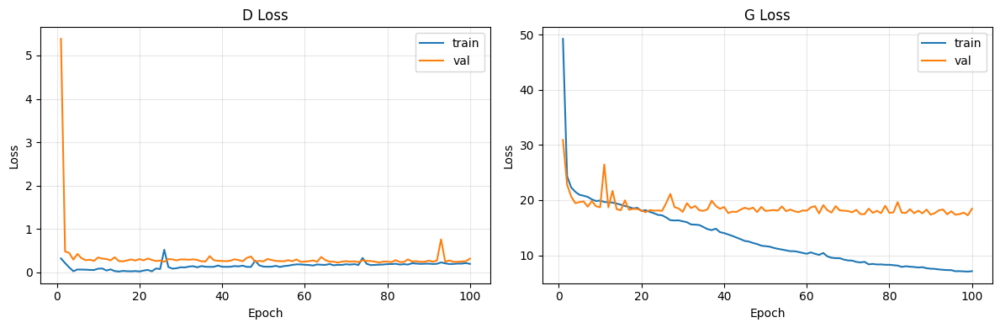

done!


In [16]:
loss_l1 = train_experiment(
    image_size=256,
    batch_size=16,
    lr=2e-4,
    l1_lambda=200,
    epochs=100,
    output_dir='experiments/l1_200'
)

---
## Results Comparison

In [17]:
import pandas as pd

experiments = {
    'baseline': 'experiments/baseline/loss_history.csv',
    'batch_32': 'experiments/batch_size_32/loss_history.csv',
    'lr_0004': 'experiments/lr_0004/loss_history.csv',
    'l1_200': 'experiments/l1_200/loss_history.csv'
}

results = []
for name, path in experiments.items():
    try:
        df = pd.read_csv(path)
        final = df.iloc[-1]
        results.append({
            'experiment': name,
            'train_G': f"{final['train_G_loss']:.4f}",
            'val_G': f"{final['val_G_loss']:.4f}",
            'train_D': f"{final['train_D_loss']:.4f}",
            'val_D': f"{final['val_D_loss']:.4f}"
        })
    except:
        print(f"missing: {path}")

if results:
    print(pd.DataFrame(results).to_string(index=False))

experiment train_G   val_G train_D  val_D
  baseline  3.5301  9.2038  0.2256 0.2515
  batch_32  3.9602  9.1104  0.2306 0.2470
   lr_0004  4.1373  9.2661  0.2266 0.2435
    l1_200  7.1126 18.4420  0.1965 0.3190


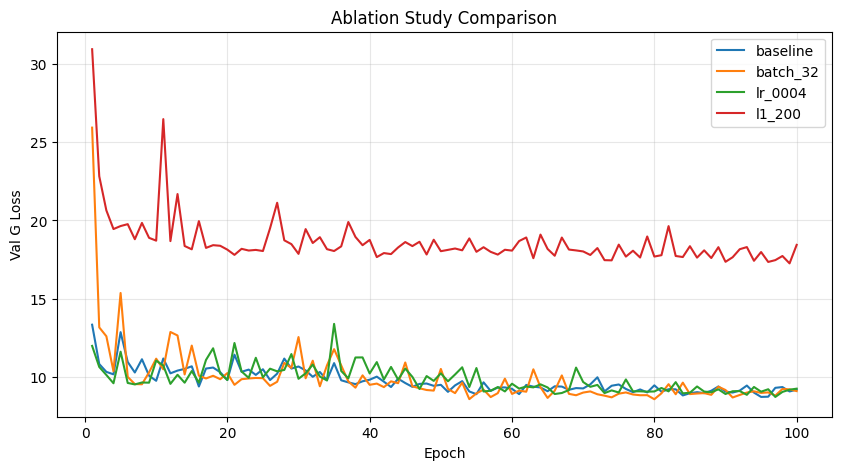

In [18]:
# plot all val G loss curves together
plt.figure(figsize=(10, 5))

for name, path in experiments.items():
    try:
        df = pd.read_csv(path)
        plt.plot(df['epoch'], df['val_G_loss'], label=name)
    except:
        pass

plt.xlabel('Epoch')
plt.ylabel('Val G Loss')
plt.title('Ablation Study Comparison')
plt.legend()
plt.grid(True, alpha=0.3)
plt.savefig('experiments/comparison.png', dpi=150)
plt.show()

---
## Visual Comparison

Generate samples from each model to see the actual output quality.

In [19]:
from torchvision import transforms
from PIL import Image

def show_results(checkpoint_path, title):
    G = UNetGenerator().to(device)
    G.load_state_dict(torch.load(checkpoint_path, map_location=device))
    G.eval()
    
    gray_transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5], std=[0.5])
    ])
    
    val_images = os.listdir('data/val')[:25]
    
    fig, axes = plt.subplots(5, 5, figsize=(12, 12))
    
    for i, img_name in enumerate(val_images):
        img = Image.open(f'data/val/{img_name}').convert('RGB')
        gray = gray_transform(img).unsqueeze(0).to(device)
        
        with torch.no_grad():
            fake = G(gray)
        
        fake = fake.squeeze().cpu().numpy().transpose(1, 2, 0)
        fake = (fake * 0.5 + 0.5).clip(0, 1)
        
        axes[i//5, i%5].imshow(fake)
        axes[i//5, i%5].axis('off')
    
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

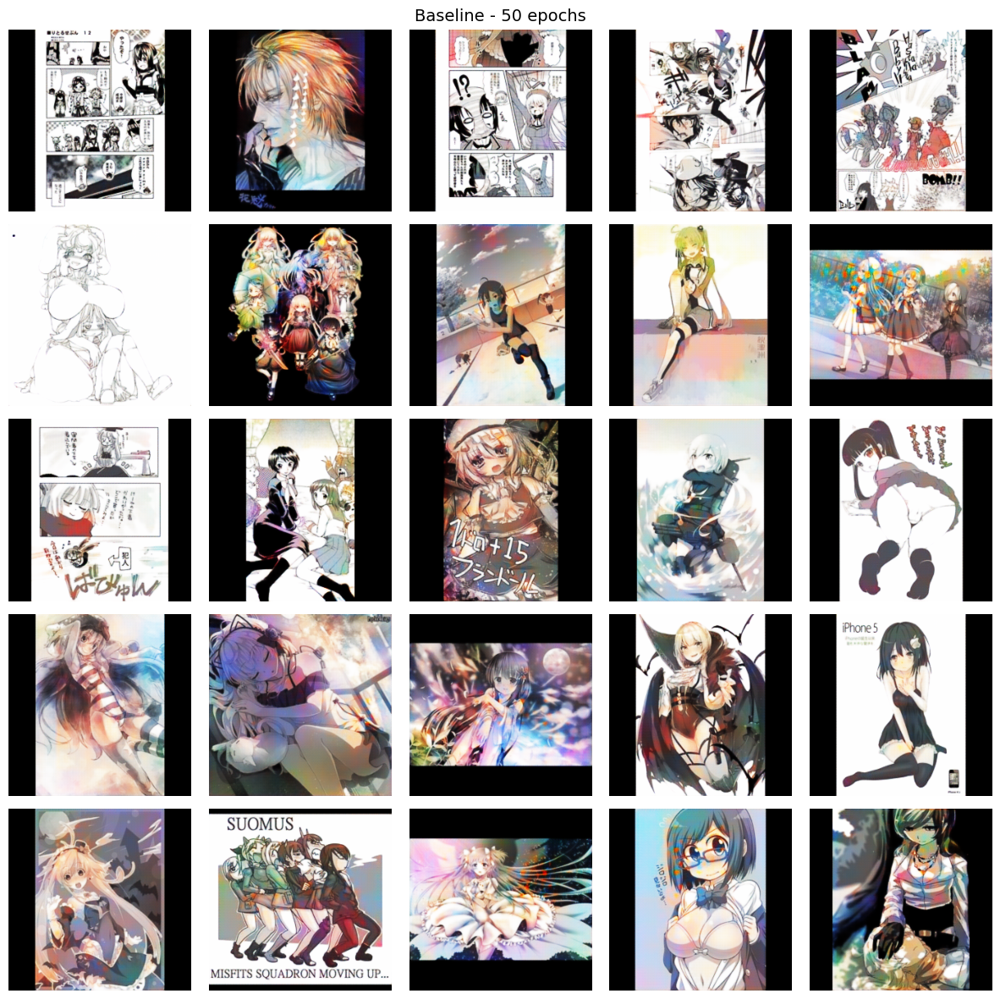

In [28]:
# compare baseline at different epochs
show_results('experiments/baseline/checkpoints/G_epoch_50.pth', 'Baseline - 50 epochs')

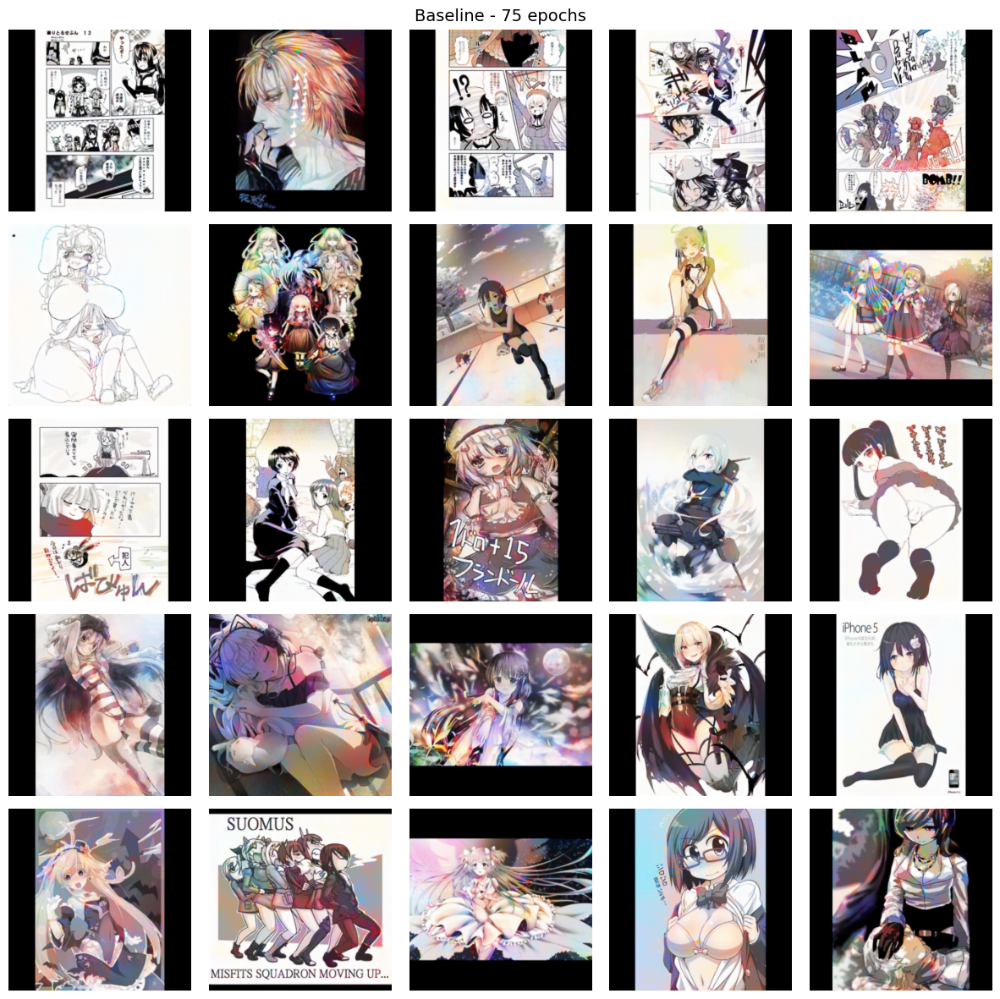

In [29]:
show_results('experiments/baseline/checkpoints/G_epoch_75.pth', 'Baseline - 75 epochs')

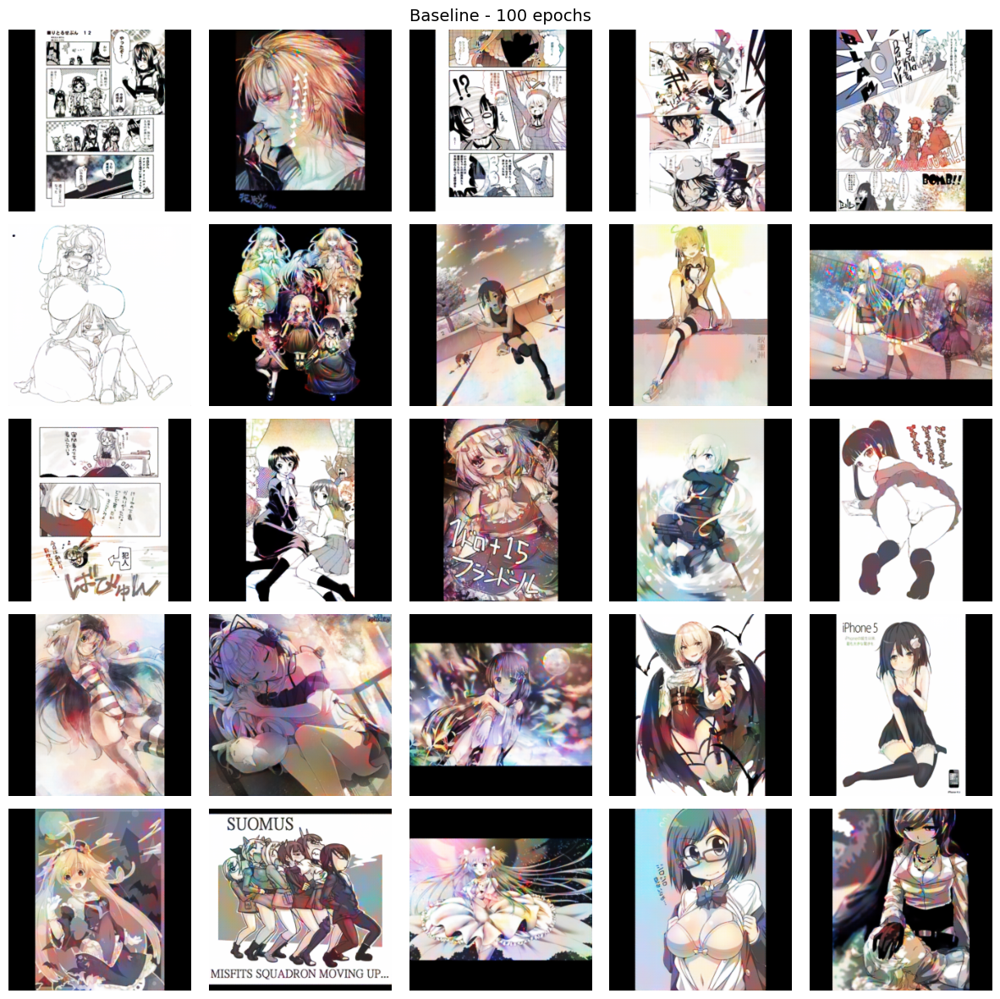

In [30]:
show_results('experiments/baseline/checkpoints/G_epoch_100.pth', 'Baseline - 100 epochs')

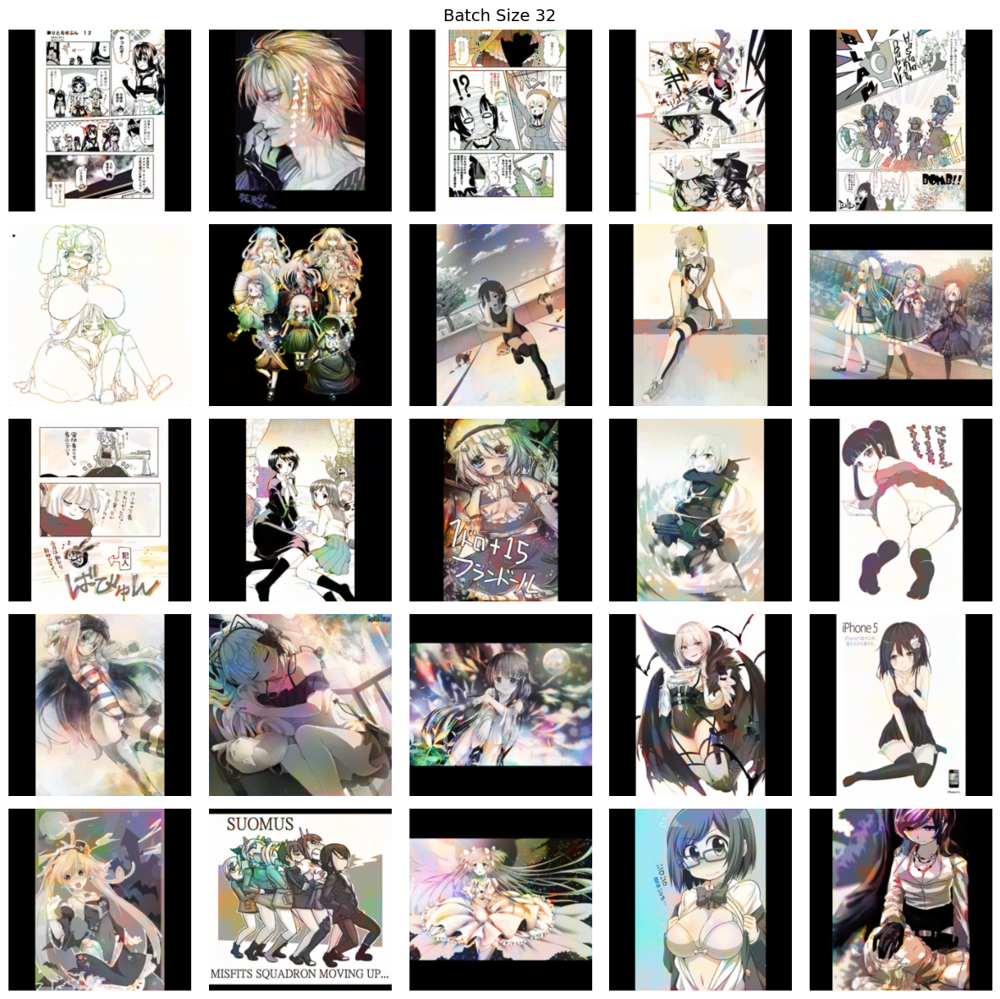

In [31]:
# compare different experiments at 100 epochs
show_results('experiments/batch_size_32/checkpoints/G_final.pth', 'Batch Size 32')

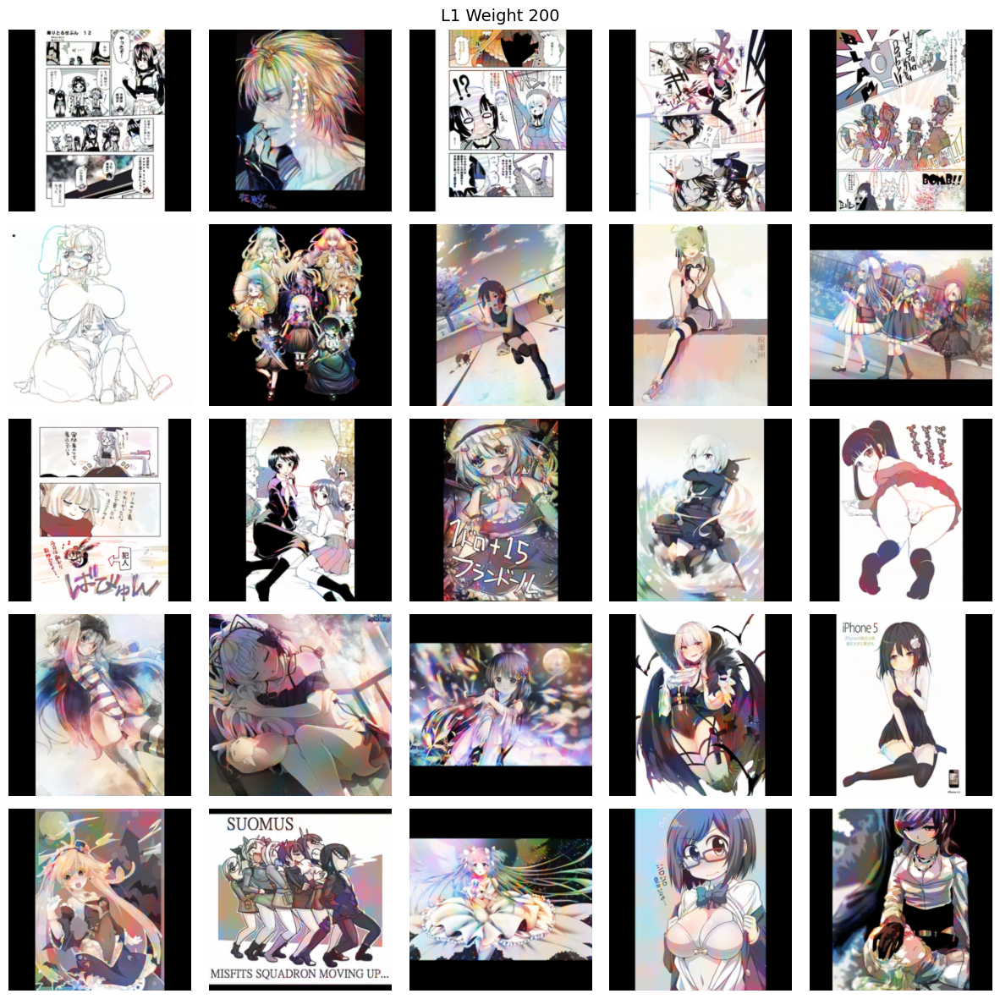

In [ ]:
show_results('experiments/l1_200/checkpoints/G_final.pth', 'L1 Weight 200')